In [1]:
!pip install bertopic

     ---------------------------------------- 0.0/57.7 kB ? eta -:--:--
     ---------------------------------------- 57.7/57.7 kB 1.5 MB/s eta 0:00:00
     ---------------------------------------- 0.0/60.8 kB ? eta -:--:--
     ---------------------------------------- 60.8/60.8 kB ? eta 0:00:00
     ---------------------------------------- 0.0/44.0 kB ? eta -:--:--
     ---------------------------------------- 44.0/44.0 kB ? eta 0:00:00
     ---------------------------------------- 0.0/41.5 kB ? eta -:--:--
     ---------------------------------------- 41.5/41.5 kB ? eta 0:00:00
   ---------------------------------------- 0.0/154.7 kB ? eta -:--:--
   ---------------------------------------- 154.7/154.7 kB 3.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/687.1 kB ? eta -:--:--
   ------------ -------------------------- 225.3/687.1 kB 14.3 MB/s eta 0:00:01
   -------------------------------- ------- 553.0/687.1 kB 8.8 MB/s eta 0:00:01
   ----------------------------


[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
# read wos data from Google Drive
import os
import pandas as pd
from bertopic import BERTopic
from sklearn.cluster import KMeans
from hdbscan import HDBSCAN
from sentence_transformers import SentenceTransformer
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer

In [24]:
"""

WRITE YOUR OWN CODE HERE:

Upload your downloaded files to Google Drive and connect to your Google Drive target folder.

Then read all the files and concatenate them into a single dataframe - df, then remove records that have no abstracts

please refer to https://images.webofknowledge.com/images/help/WOS/hs_wos_fieldtags.html for the WoS fields

"""
file_folder = 'C:\D\AI literature analysis tool\data'
data = pd.concat([pd.read_csv(os.path.join(file_folder, file), sep='\t') for file in os.listdir(file_folder)]).reset_index()

# remove records that have no abstracts
data = data.dropna(subset=['AB'])

# # if you are using data from Scopus, make sure you export all the fileds
# data = data.dropna(subset=['Abstract'])

# ***Task 1***

In [25]:
# # Task 1 - run BERTopic with default configuration and parameters, visualize generated topics, documents, and topic terms

"""
WRITE YOUR CODE HERE:

Run BERTopic with default configuration and parameters, you can refer to https://maartengr.github.io/BERTopic/index.html for example

"""
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

# Also remove stop words that does not relate to our topics, etherium, blockchain, crypto
custom_stop_words = ["ethereum", "blockchain", "cryptocurrency","android", "card", "transaction", "qr code", "twitter", "mobile "]  # Add your words here
all_stop_words = list(ENGLISH_STOP_WORDS.union(custom_stop_words))


# Remove stop word english
vectorizer_model = CountVectorizer(stop_words=all_stop_words, min_df=2, ngram_range=(1, 2))
# vectorizer_model = CountVectorizer(stop_words="english", min_df=2, ngram_range=(1, 2))


#reproductive purpose
from umap import UMAP
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

topic_model = BERTopic(umap_model=umap_model,vectorizer_model=vectorizer_model)
topics, probs = topic_model.fit_transform(data['AB'].to_list())

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,833,-1_phishing_detection_learning_data,"[phishing, detection, learning, data, attacks,...",[Phishing is one of the biggest crimes in the ...
1,0,238,0_power_grid_smart_data,"[power, grid, smart, data, energy, systems, pr...",[The rise of renewable energy integration in s...
2,1,169,1_cyber_attack_apt_detection,"[cyber, attack, apt, detection, data, cybersec...","[The rapidly developing field of ""Commercial O..."
3,2,166,2_phishing_deep_urls_url,"[phishing, deep, urls, url, deep learning, phi...",[Natural Language Processing (NLP) and Deep Le...
4,3,100,3_email_emails_spam_phishing,"[email, emails, spam, phishing, phishing email...",[Spam electronic mails (emails) refer to harmf...
5,4,76,4_phishing_websites_phishing websites_website,"[phishing, websites, phishing websites, websit...",[Phishing attacks are one of the most challeng...
6,5,70,5_phishing_feature_features_selection,"[phishing, feature, features, selection, featu...",[Phishing attacks lead to significant threats ...
7,6,62,6_graph_scams_phishing scams_transactions,"[graph, scams, phishing scams, transactions, a...",[Phishing scams are one of Ethereum's most rep...
8,7,56,7_ai_cybersecurity_cyber_intelligence,"[ai, cybersecurity, cyber, intelligence, secur...",[Artificial Intelligence (AI) is undoubtedly o...
9,8,42,8_malicious_urls_url_malicious urls,"[malicious, urls, url, malicious urls, feature...",[Uniform Resource Locator (URL) is a unique id...


In [26]:
topic_model.get_topic(0)


[('phishing', 0.03316503580306404),
 ('websites', 0.018976180944894318),
 ('features', 0.016726445059930997),
 ('urls', 0.0147576101588135),
 ('machine', 0.014418643329530526),
 ('detection', 0.013402014139484542),
 ('machine learning', 0.013089147638622928),
 ('learning', 0.01301382381840081),
 ('url', 0.012789607426985542),
 ('accuracy', 0.012412568004688445)]

In [28]:
topic_model.visualize_topics()


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'customdata': array([[0, 'phishing | websites | features | urls | machine', 436],
                                   [1, 'power | grid | smart | data | systems', 238],
                                   [2, 'iot | devices | things | network | internet things', 172],
                                   [3, 'phishing | deep | urls | url | deep learning', 164],
                                   [4, 'email | emails | spam | phishing | phishing emails', 101],
                                   [5, 'graph | scams | phishing scams | accounts | transactions', 63],
                                   [6, 'network | deep | deep learning | intrusion | intrusion detection',
                                    51],
                                   [7, 'ai | cyber | cybersecurity | intelligence | digital', 50],
                                   [8, 'fuzzy | intrusion detection | intrusion | detection | machine',
                                    50],
                                   [9, 'malware | malware detection | detection | files | malicious', 44],
                                   [10, 'social | accounts | media | social media | users', 39],
                                   [11, 'vehicles | vehicle | cavs | autonomous | security', 39],
                                   [12, 'security | data | healthcare | authentication | medical', 37],
                                   [13,
                                    'backdoor | trigger | triggers | backdoor attacks | backdoor attack',
                                    35],
                                   [14, 'industrial | systems | industrial control | control | ics', 34],
                                   [15, 'phishing | emails | email | persuasion | phishing emails', 33],
                                   [16, 'ddos | ddos attacks | sdn | attack | ddos attack', 31],
                                   [17, 'llms | ai | chatgpt | chatbots | cybersecurity', 31],
                                   [18,
                                    'adversarial | adversarial examples | examples | adversarial attacks | blackbox',
                                    30],
                                   [19, 'email | emails | phishing | model | deep learning', 30],
                                   [20, 'mobile | authentication | user | keyboard | mouse', 29],
                                   [21, 'adversarial | evasion | phishing | attacks | classifiers', 28],
                                   [22, 'ontology | cybersecurity | information | cyber | threat', 28],
                                   [23, 'rl | reinforcement | reinforcement learning | agent | drl', 28],
                                   [24, 'botnet | botnets | p2p | traffic | botnet detection', 26],
                                   [25, 'domain | dns | domains | domain names | names', 23],
                                   [26, 'voice | audio | speech | systems | adversarial', 21],
                                   [27,
                                    'malware | malware detection | applications | permission | detection',
                                    21],
                                   [28, 'face | deepfake | facial | morphing | images', 18],
                                   [29, 'fpga | circuit | hardware | puf | trojan', 17],
                                   [30,
                                    'social | social engineering | engineering | engineering attacks | human',
                                    14],
                                   [31, 'apt | apt attacks | apt attack | attack | persistent', 13],
                                   [32, 'control | controller | dos | scheme | wt', 13],
                                   [33, 'ransomware | ransomware detection | files | file | ransom', 12],
                                   [34, 'phishing | phishing attacks | attacks | children | tools', 12],
                                   [35, 'drones | gps | spoofing

In [29]:
topic_model.visualize_hierarchy()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAAD+fu8RLTXmP/5+7xEtNeY/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAAFMAAAAAAAAAUwAAAAAAAAC7AAAAAAAAALsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAAAETcIoaVLIPwRNwihpUsg/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAACAQcAAAAAAAIBBwAAAAAAAgEbAAAAAAACARsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAADLW/op7GHjP8tb+insYeM/BE3CKGlSyD8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAAOcAAAAAAAAA5wAAAAAAAAETAAAAAAAAARMA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'y1v6Kexh4z+3wYaP/wzmP7fBho//DOY/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAABAQMAAAAAAAEBAwAAAAAAAgEvAAAAAAACAS8A=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': '/n7vES015j/BkCN/in7pP8GQI3+Kfuk/t8GGj/8M5j8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAAJMAAAAAAAAAkwAAAAAAA4EXAAAAAAADgRcA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAADQ2NLlFgnZP9DY0uUWCdk/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAABAUMAAAAAAAEBQwAAAAAAAwFLAAAAAAADAUsA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': '0NjS5RYJ2T96v1rnOxbjP3q/Wuc7FuM/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAACAUcAAAAAAAIBRwAAAAAAAQFXAAAAAAABAVcA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(61,153,112)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'wZAjf4p+6T+UtlVp4qrqP5S2VWniquo/er9a5zsW4z8=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAADgOsAAAAAAAOA6wAAAAAAAYFPAAAAAAABgU8A=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'AAAAAAAAAAC9g/xDL+TgP72D/EMv5OA/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAADAXMAAAAAAAMBcwAAAAAAAQF/AAAAAAABAX8A=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text',
              'marker': {'color': 'rgb(255,65,54)'},
              'mode': 'lines',
              'type': 'scatter',
              'x': {'bdata': 'vYP8Qy/k4D/w+4i/sFflP/D7iL+wV+U/AAAAAAAAAAA=', 'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': 'AAAAAAAAXsAAAAAAAABewAAAAAAA4GDAAAAAAADgYMA=', 'dtype': 'f8'},
              'yaxis': 'y'},
             {'hoverinfo': 'text'

In [30]:
topic_model.visualize_barchart()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#D55E00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.014418643329530526, 0.0147576101588135,
                    0.016726445059930997, 0.018976180944894318,
                    0.03316503580306404],
              'xaxis': 'x',
              'y': [machine  , urls  , features  , websites  , phishing  ],
              'yaxis': 'y'},
             {'marker': {'color': '#0072B2'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.016732184044122016, 0.018992245639000618,
                    0.019639517789269933, 0.02541572235908578, 0.03531214964682977],
              'xaxis': 'x2',
              'y': [systems  , data  , smart  , grid  , power  ],
              'yaxis': 'y2'},
             {'marker': {'color': '#CC79A7'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.0160649353282167, 0.016979630200201323,
                    0.019020530405335266, 0.02330007149398122,
                    0.044094117072601025],
              'xaxis': 'x3',
              'y': [internet things  , network  , things  , devices  , iot  ],
              'yaxis': 'y3'},
             {'marker': {'color': '#E69F00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.017114026817438236, 0.01747092659571455,
                    0.01915944344065922, 0.020490036987531112, 0.03181848647942209],
              'xaxis': 'x4',
              'y': [deep learning  , url  , urls  , deep  , phishing  ],
              'yaxis': 'y4'},
             {'marker': {'color': '#56B4E9'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.015580232683880112, 0.020881867459365325,
                    0.032284309440820544, 0.04499429948704222, 0.05253415259510778],
              'xaxis': 'x5',
              'y': [phishing emails  , phishing  , spam  , emails  , email  ],
              'yaxis': 'y5'},
             {'marker': {'color': '#009E73'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.022828639958401144, 0.02376539388696862,
                    0.030211163966805475, 0.03244200690277438, 0.03677339920611075],
              'xaxis': 'x6',
              'y': [transactions  , accounts  , phishing scams  , scams  , graph
                    ],
              'yaxis': 'y6'},
             {'marker': {'color': '#F0E442'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.01798962483546511, 0.019006555721379177,
                    0.020225842506882523, 0.022427558419998876,
                    0.03493487439465695],
              'xaxis': 'x7',
              'y': [intrusion detection  , intrusion  , deep learning  , deep  ,
                    network  ],
              'yaxis': 'y7'},
             {'marker': {'color': '#D55E00'},
              'orientation': 'h',
              'type': 'bar',
              'x': [0.019227091226099984, 0.019613372627805645,
                    0.028458231379275955, 0.030728202297585487,
                    0.041701505480873445],
              'xaxis': 'x8',
              'y': [digital  , intelligence  , cybersecurity  , cyber  , ai  ],
              'yaxis': 'y8'}],
    'layout': {'annotations': [{'font': {'size': 16},
                                'showarrow': False,
                                'text': 'Topic 0',
                                'x': 0.0875,
                                'xanchor': 'center',
                                'xref': 'paper',
                                'y': 1.0,
                                'yanchor': 'bottom',
                                'yref': 'paper'},
                               {'font': {'size': 16},
                                'showarrow': False,
                                'text': 'Topic 1',
                                'x': 0.36250000000000004,
                                'xanchor': '

In [31]:
## Search for topics
similar_topics, similarity = topic_model.find_topics("email", top_n=5)
topic_model.get_topic(similar_topics[0])


[('email', 0.05253415259510778),
 ('emails', 0.04499429948704222),
 ('spam', 0.032284309440820544),
 ('phishing', 0.020881867459365325),
 ('phishing emails', 0.015580232683880112),
 ('machine', 0.013915378997177076),
 ('messages', 0.013094717383080691),
 ('spam emails', 0.012172639594641991),
 ('machine learning', 0.011983647325754713),
 ('language', 0.011734154531228627)]

In [32]:
topic_model.visualize_heatmap()


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>Similarity Score: %{z}<extra></extra>',
              'name': '0',
              'type': 'heatmap',
              'x': [0_phishing_websites_features, 1_power_grid_smart,
                    2_iot_devices_things, 3_phishing_deep_urls,
                    4_email_emails_spam, 5_graph_scams_phishing scams,
                    6_network_deep_deep learning, 7_ai_cyber_cybersecurity,
                    8_fuzzy_intrusion detection..., 9_malware_malware detection...,
                    10_social_accounts_media, 11_vehicles_vehicle_cavs,
                    12_security_data_healthcare, 13_backdoor_trigger_triggers,
                    14_industrial_systems_indus..., 15_phishing_emails_email,
                    16_ddos_ddos attacks_sdn, 17_llms_ai_chatgpt,
                    18_adversarial_adversarial ..., 19_email_emails_phishing,
                    20_mobile_authentication_user, 21_adversarial_evasion_phis...,
                    22_ontology_cybersecurity_i..., 23_rl_reinforcement_reinfor...,
                    24_botnet_botnets_p2p, 25_domain_dns_domains,
                    26_voice_audio_speech, 27_malware_malware detectio...,
                    28_face_deepfake_facial, 29_fpga_circuit_hardware,
                    30_social_social engineerin..., 31_apt_apt attacks_apt attack,
                    32_control_controller_dos, 33_ransomware_ransomware de...,
                    34_phishing_phishing attack..., 35_drones_gps_spoofing,
                    36_forecasting_time series_...],
              'xaxis': 'x',
              'y': [0_phishing_websites_features, 1_power_grid_smart,
                    2_iot_devices_things, 3_phishing_deep_urls,
                    4_email_emails_spam, 5_graph_scams_phishing scams,
                    6_network_deep_deep learning, 7_ai_cyber_cybersecurity,
                    8_fuzzy_intrusion detection..., 9_malware_malware detection...,
                    10_social_accounts_media, 11_vehicles_vehicle_cavs,
                    12_security_data_healthcare, 13_backdoor_trigger_triggers,
                    14_industrial_systems_indus..., 15_phishing_emails_email,
                    16_ddos_ddos attacks_sdn, 17_llms_ai_chatgpt,
                    18_adversarial_adversarial ..., 19_email_emails_phishing,
                    20_mobile_authentication_user, 21_adversarial_evasion_phis...,
                    22_ontology_cybersecurity_i..., 23_rl_reinforcement_reinfor...,
                    24_botnet_botnets_p2p, 25_domain_dns_domains,
                    26_voice_audio_speech, 27_malware_malware detectio...,
                    28_face_deepfake_facial, 29_fpga_circuit_hardware,
                    30_social_social engineerin..., 31_apt_apt attacks_apt attack,
                    32_control_controller_dos, 33_ransomware_ransomware de...,
                    34_phishing_phishing attack..., 35_drones_gps_spoofing,
                    36_forecasting_time series_...],
              'yaxis': 'y',
              'z': {'bdata': ('/v9/P5yF+z7klhU/odljP4OKZD+f1D' ... '91BfY+ilwTPwyg/T6VrxA//v9/Pw=='),
                    'dtype': 'f4',
                    'shape': '37, 37'}}],
    'layout': {'coloraxis': {'colorbar': {'title': {'text': 'Similarity Score'}},
                             'colorscale': [[0.0, 'rgb(247,252,240)'], [0.125,
                                            'rgb(224,243,219)'], [0.25,
                                            'rgb(204,235,197)'], [0.375,
                                            'rgb(168,221,181)'], [0.5,
                                            'rgb(123,204,196)'], [0.625,
                                            'rgb(78,179,211)'], [0.75,
                                            'rgb(43,140,190)'], [0.875,
                                            'rgb(8,104,172)'], [1.0,
                                            'rgb(8,64,129)']]},
               'heig

In [33]:
topic_model.visualize_documents(docs=data['AB'].to_list())

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'hovertext': array(['In the field of anomaly detection, well-known techniques and state-of-the-art models often face challenges when interpreting the latent space, which hinders their behavioral classification accuracy. Firstly, the suboptimal distribution of data points within the latent space makes normal behavioral regions verbose and indistinguishable from abnormal regions. Secondly, within the latent space, it can be difficult to identify meaningful, separable, and indicative features. Finally, the processing time at the inference stage is still relatively slow. This paper aims to improve the accuracy of network anomaly detection mechanisms by proposing two novel deep hierarchical representation learning models: Deep Nested Clustering Auto-Encoder (DNCAE) and Deep Clustering Hierarchical Auto-Encoder (DCHAE). Both models adopt a nested branch structure, utilizing dual deep auto-encoders to establish hierarchical latent spaces; in each, clustering algorithms are used to spatially optimize and refine the data points. This approach results in improved separation between normal and abnormal data points, and easier identification of notable and/or indicative features. To ascertain the effectiveness of the approach and the quality of resulting features, both models were used in conjunction with ten different one-class anomaly detectors. Each of these ten anomaly detectors was evaluated on popular network intrusion datasets, notably: NSL-KDD, UNSW-NB15, CIC-IDS-2017, CSE-CICIDS-2018, and CTU13. Experimental results have confirmed that both of the proposed models produced higher levels of accuracy than existing baselines and current state-of-the-art models. Additionally, the processing time at the inference stage shows a significant reduction.',
                                  'The emergence of online services in our daily lives has been accompanied by a range of malicious attempts to trick individuals into performing undesired actions, often to the benefit of the adversary. The most popular medium of these attempts is phishing attacks, mainly through emails and websites. In order to defend against such attacks, there is an urgent need for automated mechanisms to identify this malicious content before it reaches users. Machine learning techniques have gradually become the standard for such classification problems. However, identifying common measurable features of phishing content (e.g., in emails) is notoriously difficult. To address this problem, we engage in a novel study into a phishing content classifier based on a recurrent neural network (RNN), which identifies such features without human input. At this stage, we scope our research to emails, but our approach can be extended to apply to websites. Our results show that the proposed system outperforms state-of-the-art tools. Furthermore, our classifier is efficient and takes into account only the text and, in particular, the textual structure of the email. Since these features are rarely considered in email classification, we argue that our classifier can complement existing classifiers with high information gain.',
                                  'Emails are the most popular and efficient communication method that makes them vulnerable to misuse. Federated learning (FL) provides a decentralized machine learning (ML) model, where a central server coordinates clients that collaboratively train a sharedML model. This paper proposes Federated Phishing Filtering (FPF) technique based on federated learning, natural language processing, and deep learning. FL for intelligent algorithms fuses trained models of ML algorithms from multiple sites for collective learning. This approach improvesML performance by utilizing large collective training data sets across the corporate client base, resulting in higher phishing email detection accuracy. FPF techniques preserve email privacy using local feature extraction on client emai

# **Task 2**

In [ ]:
# Task 2 - change the clustering algorithm to K-Means and find the optimal number of clusters k, decide it by using elbow method and silhouette analysis

# elbow method: https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/
# silhouette analysis: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

from umap import UMAP
from sklearn.metrics import silhouette_score

# get the embeddings of documents
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(list(data['AB']), show_progress_bar=True)
projection = UMAP().fit_transform(embeddings)

Batches:   0%|          | 0/82 [00:00<?, ?it/s]

In [ ]:
"""
WRITE YOUR CODE HERE:

find the optimal parameter for K-means on your dataset by referrring to the following materials:

K-means: 5 based on the analysis

Elbow method code: refer to https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/
Silhouette analysis code: refer to https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

"""



## Elbow method

In [ ]:
# Initialize lists to store distortion and inertia values
import numpy as np
from scipy.spatial.distance import cdist


distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)

# Fit K-means for different values of k
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=42).fit(projection)

    # Calculate distortion as the average squared distance from points to their cluster centers
    distortions.append(sum(np.min(cdist(projection, kmeanModel.cluster_centers_, 'euclidean'), axis=1)**2) / projection.shape[0])

    # Inertia is calculated directly by KMeans
    inertias.append(kmeanModel.inertia_)

    # Store the mappings for easy access
    mapping1[k] = distortions[-1]
    mapping2[k] = inertias[-1]

Distortion values:
1 : 14.668285236851196
2 : 4.515954505535307
3 : 3.1005483563784404
4 : 2.6318517668105565
5 : 1.8778718313639065
6 : 1.4452469634353609
7 : 1.2628897029419623
8 : 0.9917818128088697
9 : 0.9201058366569341


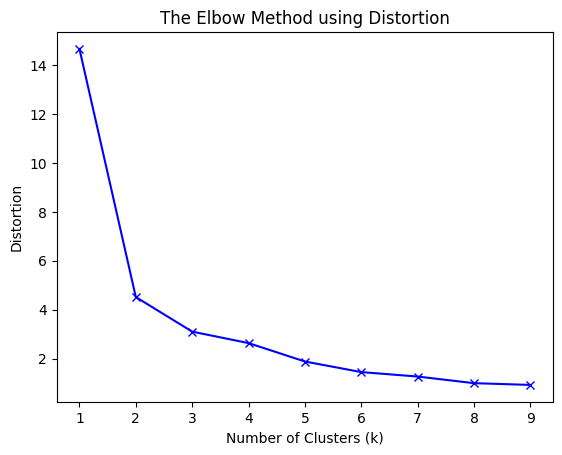

In [ ]:
print("Distortion values:")
for key, val in mapping1.items():
    print(f'{key} : {val}')
# Plotting the graph of k versus Distortion
plt.plot(K, distortions, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')

plt.show()

Inertia values:
1 : 38416.22265625
2 : 11827.2666015625
3 : 8120.33154296875
4 : 6892.818359375
5 : 4918.14501953125
6 : 3785.100341796875
7 : 3307.50830078125
8 : 2597.4775390625
9 : 2409.75830078125


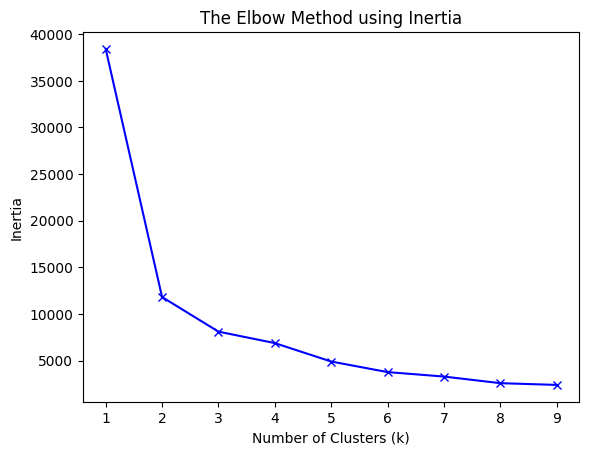

In [ ]:
print("Inertia values:")
for key, val in mapping2.items():
    print(f'{key} : {val}')

plt.plot(K, inertias, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()


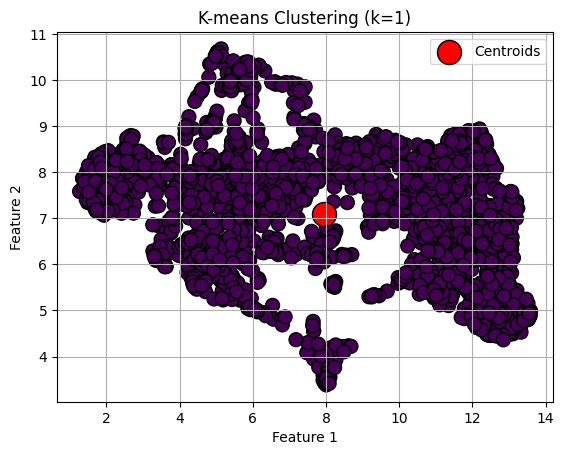

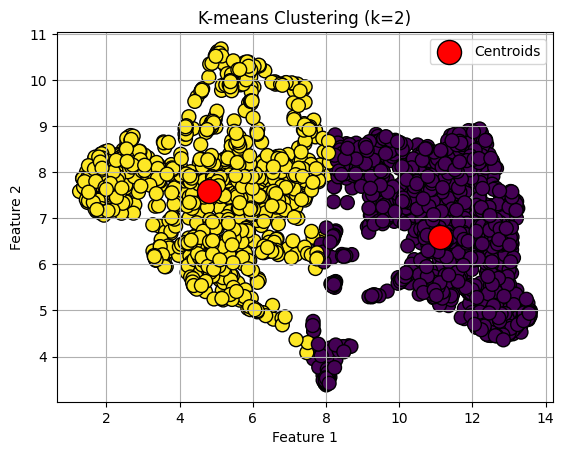

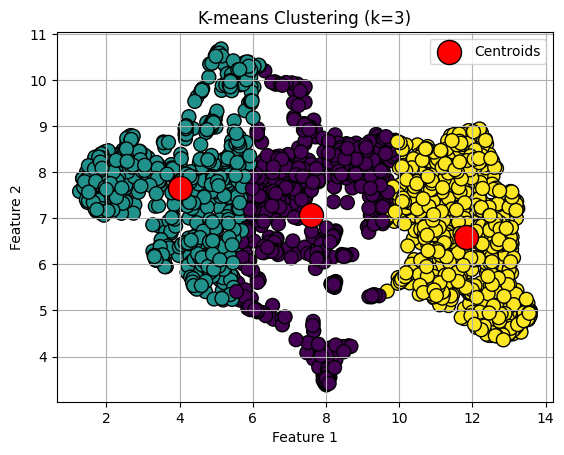

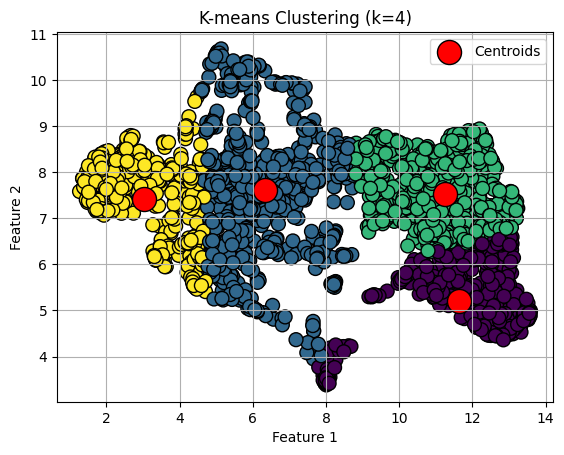

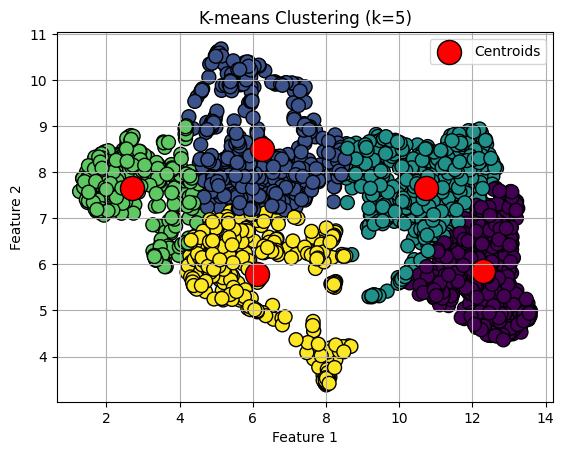

In [ ]:
k_range = range(1, 6)

for k in k_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    y_kmeans = kmeans.fit_predict(projection)

    plt.scatter(projection[:, 0], projection[:, 1], c=y_kmeans, cmap='viridis', marker='o', edgecolor='k', s=100)
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                s=300, c='red', label='Centroids', edgecolor='k')
    plt.title(f'K-means Clustering (k={k})')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.grid()
    plt.show()


The optimal k means for elbow analysis is 5

## **Silhoutte Method**

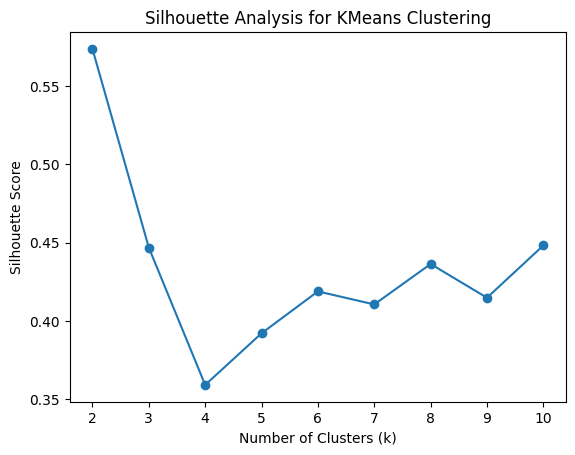

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Range of k values to test
k_range = range(2, 11)  # Adjust the range as needed

# Store silhouette scores for each k
silhouette_scores = []

# Loop through different k values
for k in k_range:
    # Initialize and fit KMeans
    kmeans = KMeans(n_clusters=k, random_state=42)  # Use same random_state as before
    cluster_labels = kmeans.fit_predict(projection)  # Use projection from UMAP

    # Calculate silhouette score
    score = silhouette_score(projection, cluster_labels)
    silhouette_scores.append(score)

# Plot the silhouette scores
plt.plot(k_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis for KMeans Clustering')
plt.show()

For n_clusters = 2, the average silhouette_score is: 0.5738
For n_clusters = 3, the average silhouette_score is: 0.4469
For n_clusters = 4, the average silhouette_score is: 0.3592
For n_clusters = 5, the average silhouette_score is: 0.3922
For n_clusters = 6, the average silhouette_score is: 0.4189
For n_clusters = 7, the average silhouette_score is: 0.4106
For n_clusters = 8, the average silhouette_score is: 0.4364
For n_clusters = 9, the average silhouette_score is: 0.4149
For n_clusters = 10, the average silhouette_score is: 0.4483


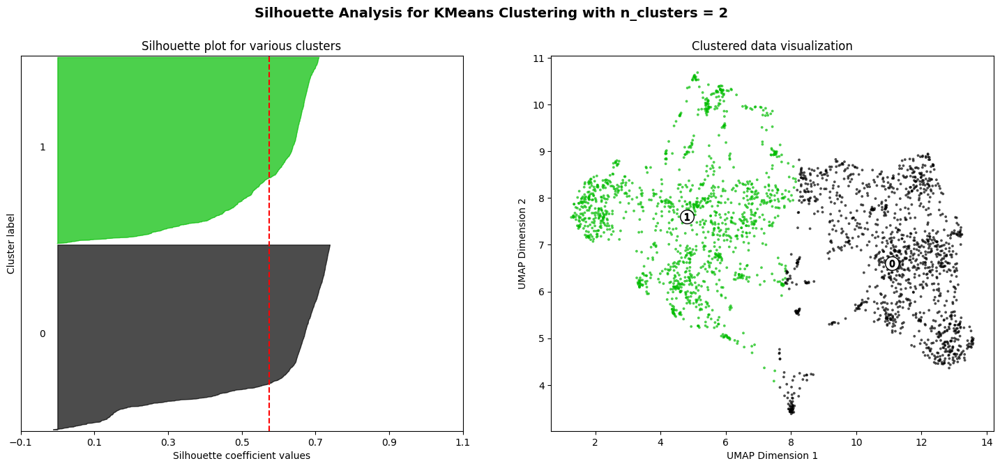

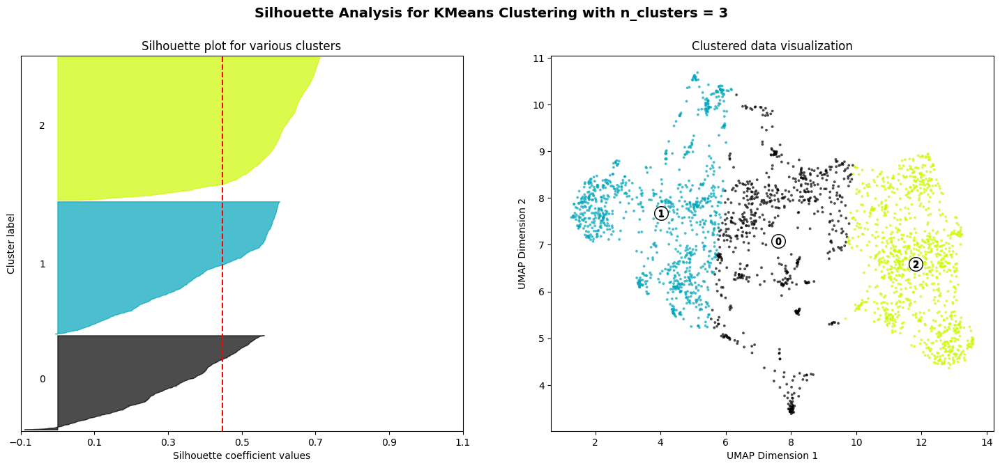

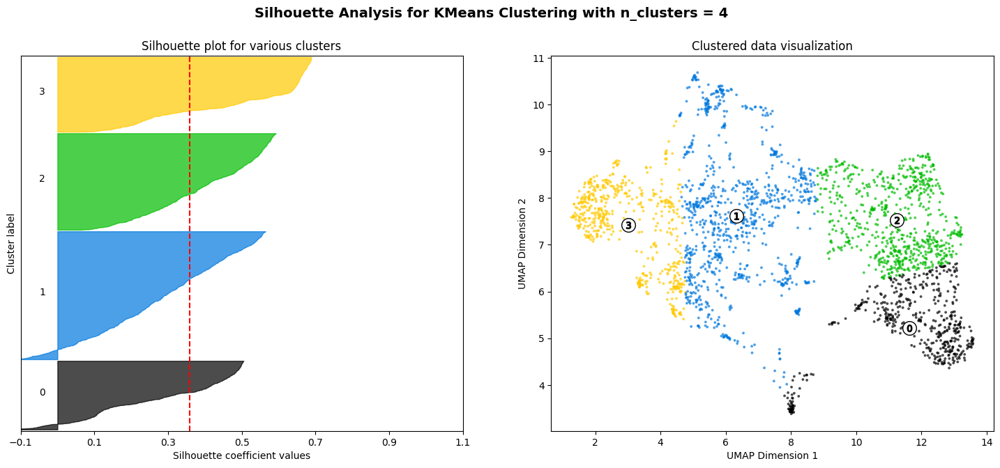

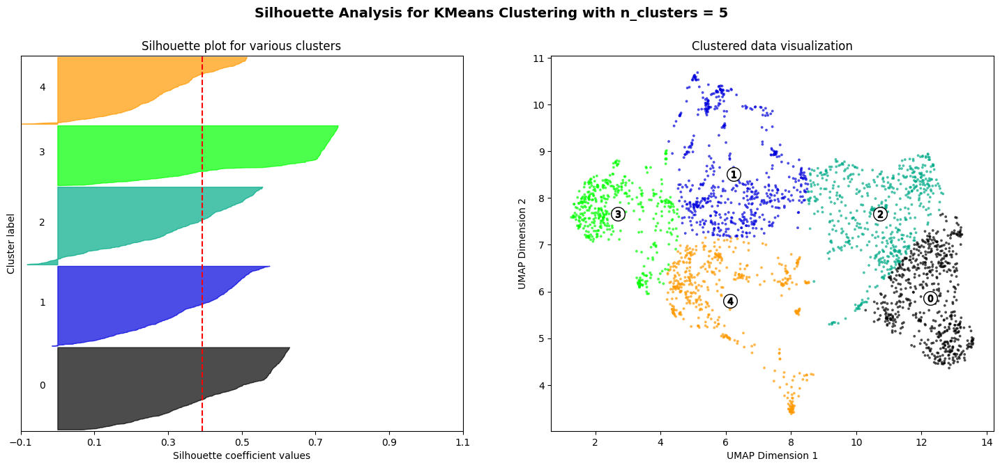

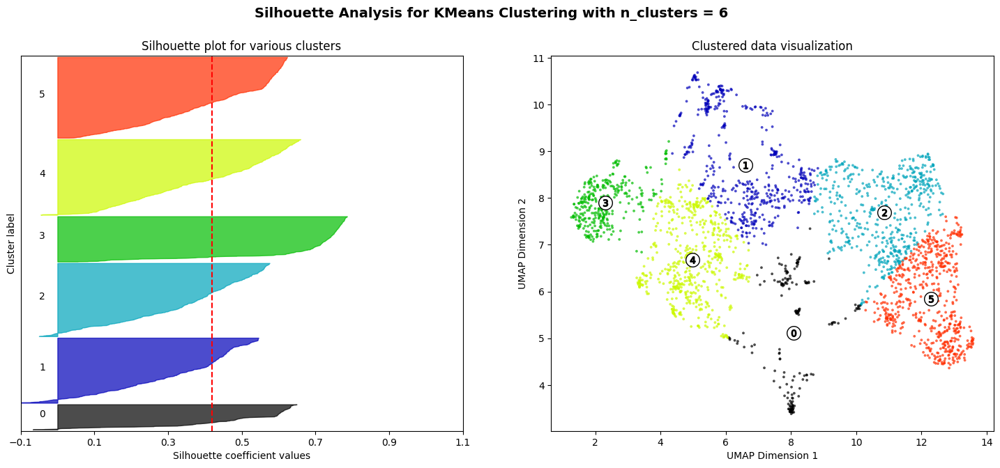

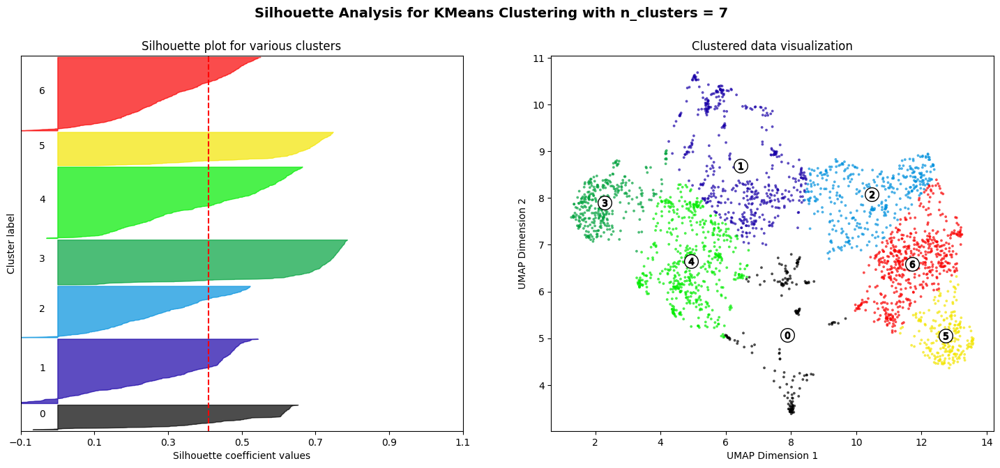

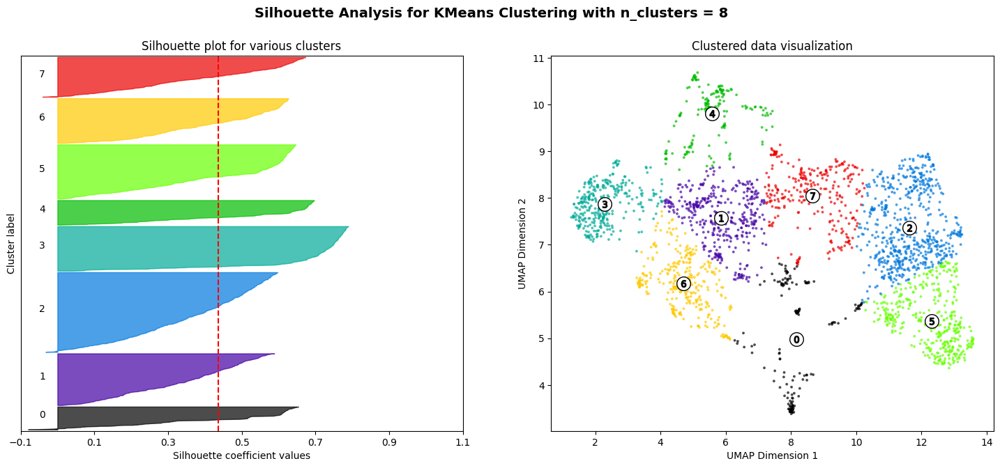

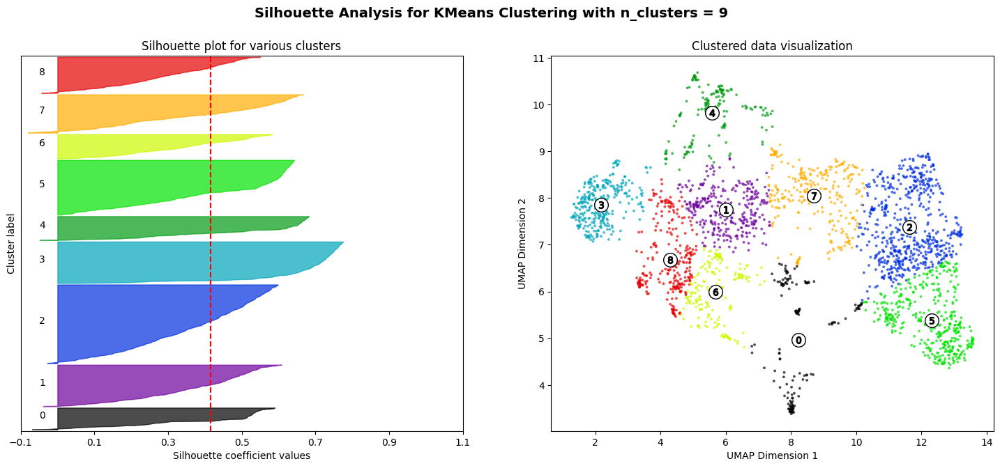

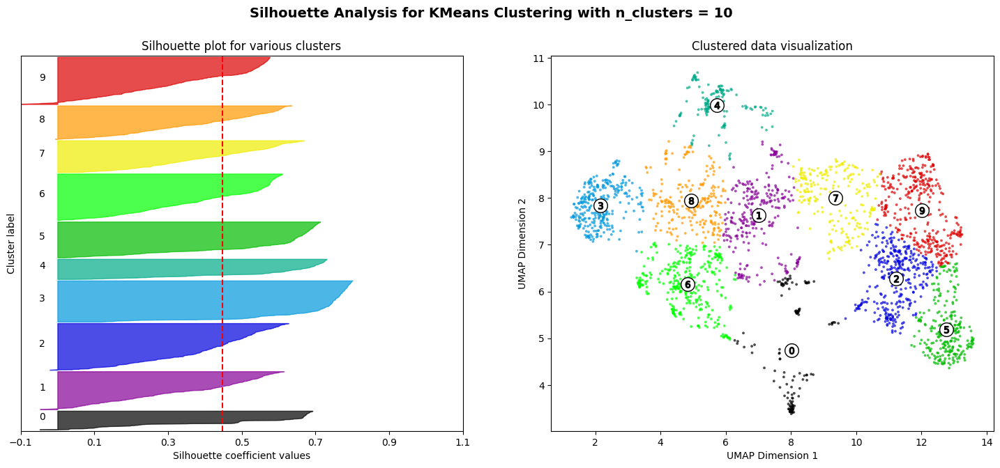

In [ ]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

# Range of k values to test
k_range = range(2, 11)  # You can adjust this range as needed

for n_clusters in k_range:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(projection) + (n_clusters + 1) * 10])

    # Fit KMeans to your projection data
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(projection)

    # Calculate silhouette scores
    silhouette_avg = silhouette_score(projection, cluster_labels)
    print(f"For n_clusters = {n_clusters}, the average silhouette_score is: {silhouette_avg:.4f}")
    sample_silhouette_values = silhouette_samples(projection, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("Silhouette plot for various clusters")
    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks(np.arange(-0.1, 1.1, 0.2))

    # 2nd plot: scatter of clustered data
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        projection[:, 0], projection[:, 1], marker=".", s=30, lw=0, alpha=0.7,
        c=colors, edgecolor="k"
    )

    centers = kmeans.cluster_centers_
    ax2.scatter(
        centers[:, 0], centers[:, 1], marker='o', c='white', alpha=1,
        s=200, edgecolor='k'
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker=f"${i}$", alpha=1, s=50, edgecolor='k')

    ax2.set_title("Clustered data visualization")
    ax2.set_xlabel("UMAP Dimension 1")
    ax2.set_ylabel("UMAP Dimension 2")

    plt.suptitle(
        f"Silhouette Analysis for KMeans Clustering with n_clusters = {n_clusters}",
        fontsize=14, fontweight='bold'
    )

plt.show()


Comments (AI-generated):
Elbow Method

Inertia Calculation:

The code calculates the inertia for a range of k values (1 to 10). Inertia is the sum of squared distances of samples to their closest cluster center.
A distortions list is computed in addition to inertias. Distortion is similar to inertia.
Elbow Plot:

A plot is generated showing inertia values against the number of clusters (k).
The "elbow" point on the plot suggests the optimal k. It's the point where the decrease in inertia starts to slow down significantly.
Interpretation
For the elbow method, the plot suggests that k=3 or k=5 might be appropriate.
Silhouette Analysis

Silhouette Score:

The code calculates the silhouette score for a range of k values (2 to 10). The silhouette score measures how similar a data point is to its own cluster compared to other clusters.
A plot is generated showing the average silhouette score against the number of clusters (k).
Interpretation:

The Silhouette method uses the silhouette scores to assess the quality of the clusters. This analysis reveals that the Silhouette score is highest for k=2 at approximately 0.32, indicating that 2 clusters provide the most distinct and well-separated groups in the data.
The silhouette score for k=3 is around 0.30, suggesting that although lower than for k=2, 3 clusters still offer reasonably distinct grouping, but slightly less so than 2 clusters.

Determining Optimal k

Combined Analysis: By considering both the Elbow method and Silhouette analysis, the optimal k is likely 3 or 5. The Elbow method shows a noticeable drop in inertia around k=3 and k=5. The Silhouette analysis has its highest values for k=2 and k=3.

Prioritizing Silhouette: Silhouette analysis offers a more quantitative evaluation of clustering quality. Thus, k=3 would be a slightly better choice if you prefer a more robust and clear separation between clusters. But, if a smaller k is preferrable to reduce model complexity, k=2 might be used instead.




# Data visualize with K-means : 8

In [ ]:
from sklearn.cluster import KMeans
from bertopic import BERTopic

# Assuming 'embeddings' and 'vectorizer_model' are already defined
kmeans_model = KMeans(n_clusters=6, random_state=42) # Use optimal k found
topic_model_with_kmeans = BERTopic(
    embedding_model="all-MiniLM-L6-v2",  # Assuming you're using this model
    vectorizer_model=vectorizer_model,  # Use your vectorizer
    hdbscan_model=kmeans_model,          # Specify KMeans as the clustering model
)
topics, probs = topic_model_with_kmeans.fit_transform(data['AB'].to_list())



ModuleNotFoundError: No module named 'bertopic'

In [ ]:
topic_model_with_kmeans.visualize_topics()

NameError: name 'topic_model_with_kmeans' is not defined

In [ ]:
topic_model_with_kmeans.visualize_hierarchy()

In [ ]:
topic_model_with_kmeans.visualize_barchart()

In [ ]:
topic_model_with_kmeans.visualize_heatmap()


In [ ]:
topic_model_with_kmeans.visualize_documents(docs=data['AB'].to_list())

# **Task 3**

In [ ]:
# Task 3 (optional) relabel the topics with large language models (ChatGPT).

# you may refer to https://maartengr.github.io/BERTopic/getting_started/representation/llm.html#truncating-documents

In [ ]:
# If you have any issues with using BERTopic, please first refer to the FAQ page for help: https://maartengr.github.io/BERTopic/faq.html